In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/roof-dammage/116_PNG_jpg.rf.00ac19bc529f5fedfa4841b81b5efc38.jpg
/kaggle/input/roof-dammage/116_PNG_jpg.rf.00ac19bc529f5fedfa4841b81b5efc38.txt
/kaggle/input/roof-dammage/DJI_0414_JPG_jpg.rf.ab38f72c9d72dd29ab85381d35d28b4f.txt
/kaggle/input/roof-dammage/155_PNG_jpg.rf.470d5173d6dca5a52cc7ce454142ac24.txt
/kaggle/input/roof-dammage/158_PNG_jpg.rf.178572bcbe83cfaee9927c01b579b141.jpg
/kaggle/input/roof-dammage/DJI_0414_JPG_jpg.rf.b48ab17bf4b7d4cb67d4dc0669a1a866.txt
/kaggle/input/roof-dammage/47_PNG_jpg.rf.51b9748d86486d5864ea8d3d19b047be.jpg
/kaggle/input/roof-dammage/186_PNG_jpg.rf.f73ce7699859aafb3807f892d2e08ea1.jpg
/kaggle/input/roof-dammage/DJI_0414_JPG_jpg.rf.1bf2cd14f24735079b97e3a41debcabb.txt
/kaggle/input/roof-dammage/DJI_0055_JPG_jpg.rf.56ce5141b59e1f1e43904fddfd9b2970.jpg
/kaggle/input/roof-dammage/121_PNG_jpg.rf.d0e0656b402fcaa7cd76a71879908a62.txt
/kaggle/input/roof-dammage/DJI_0414_JPG_jpg.rf.1b998cb7b3550b89b15e934d433bdea3.txt
/kaggle/input/roof-dammage/4

In [2]:
import os
import random
import cv2
import numpy as np
from IPython.display import display, Image
from tqdm import tqdm 
import random
import matplotlib.pyplot as plt

import yaml

import shutil

In [3]:
import os

# Lister tous les datasets disponibles
print(os.listdir("/kaggle/input"))
datapath = "/kaggle/input/roof-dammage"


['roof-dammage']


📂 Chemin du dataset : /kaggle/input/roof-dammage
🖼️ Nombre d'images trouvées : 137
Exemple fichiers image : ['116_PNG_jpg.rf.00ac19bc529f5fedfa4841b81b5efc38.jpg', '158_PNG_jpg.rf.178572bcbe83cfaee9927c01b579b141.jpg', '47_PNG_jpg.rf.51b9748d86486d5864ea8d3d19b047be.jpg', '186_PNG_jpg.rf.f73ce7699859aafb3807f892d2e08ea1.jpg', 'DJI_0055_JPG_jpg.rf.56ce5141b59e1f1e43904fddfd9b2970.jpg']
📑 Nombre de fichiers annotation trouvés : 137
Exemple fichiers annotation : ['116_PNG_jpg.rf.00ac19bc529f5fedfa4841b81b5efc38.txt', '158_PNG_jpg.rf.178572bcbe83cfaee9927c01b579b141.txt', '47_PNG_jpg.rf.51b9748d86486d5864ea8d3d19b047be.txt', '186_PNG_jpg.rf.f73ce7699859aafb3807f892d2e08ea1.txt', 'DJI_0055_JPG_jpg.rf.56ce5141b59e1f1e43904fddfd9b2970.txt']
✅ Nombre de paires (image+annotation) sélectionnées : 25

➡️ Image 1: /kaggle/input/roof-dammage/DJI_0414_JPG_jpg.rf.1bf2cd14f24735079b97e3a41debcabb.jpg
   ↳ 5 annotations trouvées dans DJI_0414_JPG_jpg.rf.1bf2cd14f24735079b97e3a41debcabb.txt
      Classe

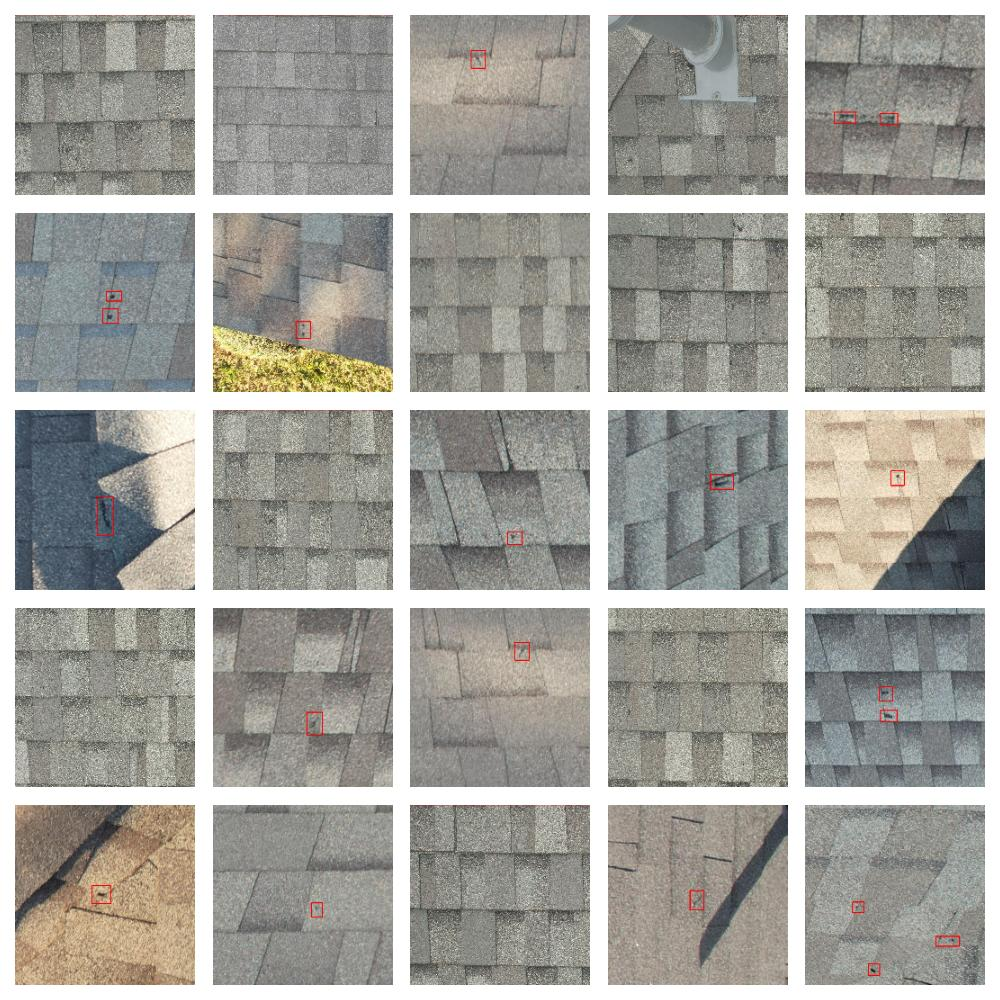

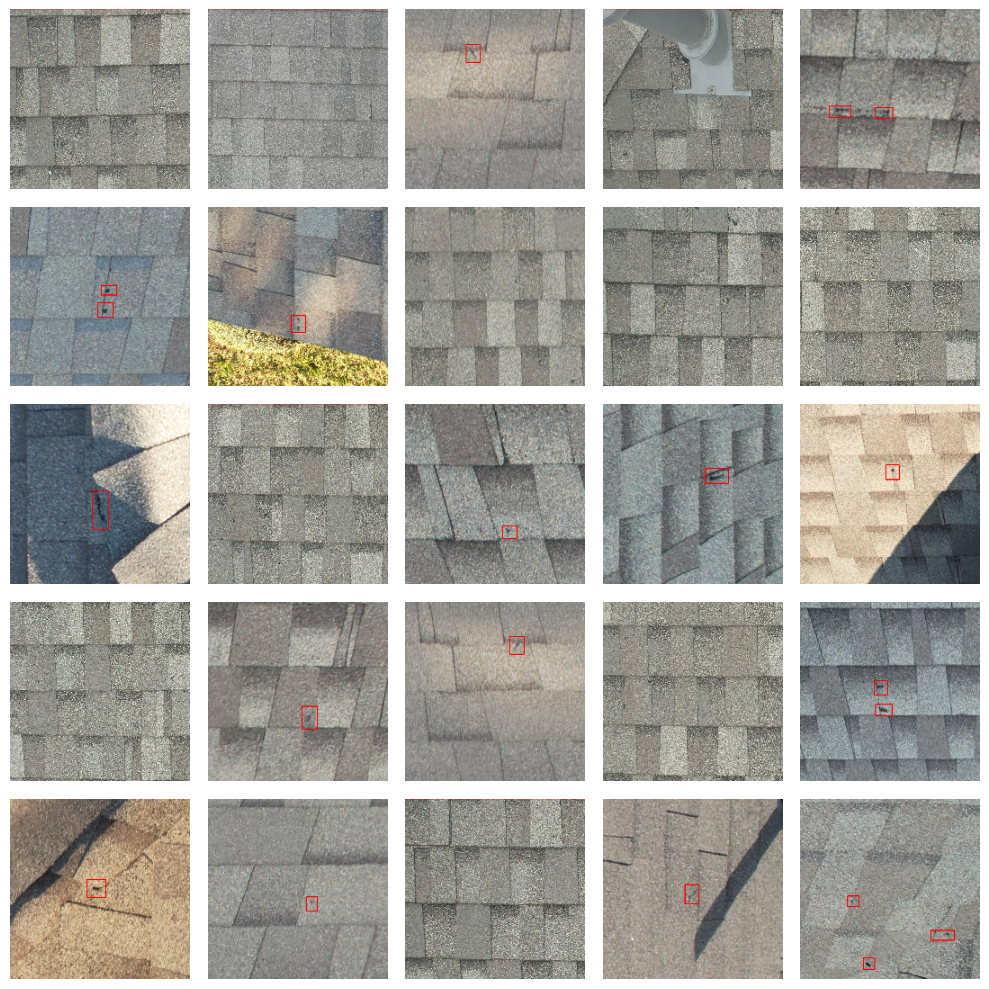

In [4]:
# Define class names
class_names = ['1', '2', '3', '4', '5', '7', '8', '9']

def plot_random_annotated_images(folder_path, grid_size=(5, 5), image_size=(200, 200)):
    print("📂 Chemin du dataset :", folder_path)

    image_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.tiff')
    image_files = [f for f in os.listdir(folder_path) if f.endswith(image_extensions)]
    print("🖼️ Nombre d'images trouvées :", len(image_files))
    print("Exemple fichiers image :", image_files[:5])

    annotation_files = [
        f.rsplit('.', 1)[0] + '.txt'
        for f in image_files
        if os.path.exists(os.path.join(folder_path, f.rsplit('.', 1)[0] + '.txt'))
    ]
    print("📑 Nombre de fichiers annotation trouvés :", len(annotation_files))
    print("Exemple fichiers annotation :", annotation_files[:5])

    if len(annotation_files) == 0:
        print("⚠️ Aucune annotation trouvée, vérifie ton dataset !")
        return

    selected_files = random.sample(list(zip(image_files, annotation_files)), min(25, len(image_files)))
    print("✅ Nombre de paires (image+annotation) sélectionnées :", len(selected_files))

    fig, axes = plt.subplots(*grid_size, figsize=(10, 10))
    axes = axes.ravel()

    for idx, (img_file, ann_file) in enumerate(selected_files):
        img_path = os.path.join(folder_path, img_file)
        print(f"\n➡️ Image {idx+1}: {img_path}")

        image = cv2.imread(img_path)
        if image is None:
            print("⚠️ Impossible de lire l'image :", img_file)
            continue

        h, w, _ = image.shape
        ann_path = os.path.join(folder_path, ann_file)

        with open(ann_path, 'r') as f:
            annotations = f.readlines()
        print(f"   ↳ {len(annotations)} annotations trouvées dans {ann_file}")

        for ann in annotations:
            data = list(map(float, ann.strip().split()))
            class_id = int(data[0])
            print("      Classe détectée :", class_id, "→", class_names[class_id] if class_id < len(class_names) else "❌ hors range")

            x_center, y_center, width, height = data[1], data[2], data[3], data[4]
            x_center, y_center, width, height = x_center * w, y_center * h, width * w, height * h
            top_left = (int(x_center - width / 2), int(y_center - height / 2))
            bottom_right = (int(x_center + width / 2), int(y_center + height / 2))
            cv2.rectangle(image, top_left, bottom_right, (0,0,255), 2)
            cv2.putText(image, class_names[class_id], (top_left[0], top_left[1] - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (144, 238, 144), 1)

        small_image = cv2.resize(image, image_size)
        axes[idx].imshow(cv2.cvtColor(small_image, cv2.COLOR_BGR2RGB))
        axes[idx].axis('off')

    for j in range(len(selected_files), grid_size[0] * grid_size[1]):
        axes[j].axis('off')

    plt.tight_layout()
    plt.subplots_adjust(wspace=0.1, hspace=0.1)
    fig.savefig('final_canvas.jpg', dpi=100, format='jpg')
    print("💾 Figure sauvegardée sous final_canvas.jpg")
    display(Image(filename='final_canvas.jpg'))


### calling
plot_random_annotated_images(datapath)


In [5]:
import os
import shutil

def copy_images_with_annotations(folder_path, with_anno_folder='with_anno'):
    """
    Copies images that have corresponding annotation files to a specified folder.

    Parameters:
    - folder_path (str): Path to the folder containing both images and annotation files.
    - with_anno_folder (str): Folder where images with annotations will be copied, default is 'with_anno'.
    """
    if not os.path.exists(with_anno_folder):
        os.makedirs(with_anno_folder)
        print(f"📂 Dossier créé : {with_anno_folder}")

    image_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.tiff')
    image_files = [f for f in os.listdir(folder_path) if f.endswith(image_extensions)]
    print("🖼️ Nombre d'images trouvées :", len(image_files))

    copied = 0
    skipped = 0

    for img_file in image_files:
        img_path = os.path.join(folder_path, img_file)
        ann_file = img_file.rsplit('.', 1)[0] + '.txt'
        ann_path = os.path.join(folder_path, ann_file)

        if os.path.exists(ann_path) and os.path.getsize(ann_path) > 0:
            shutil.copy(img_path, os.path.join(with_anno_folder, img_file))
            shutil.copy(ann_path, os.path.join(with_anno_folder, ann_file))
            copied += 1
            print(f"✅ Copié : {img_file} + {ann_file}")
        else:
            skipped += 1
            print(f"⚠️ Ignoré : {img_file} (annotation manquante ou vide)")

    print("\nRésumé :")
    print(f"   ✅ {copied} images copiées avec annotations")
    print(f"   ⚠️ {skipped} images ignorées (pas d'annotations valides)")

# Exemple d'appel
copy_images_with_annotations(datapath)


📂 Dossier créé : with_anno
🖼️ Nombre d'images trouvées : 137
✅ Copié : 116_PNG_jpg.rf.00ac19bc529f5fedfa4841b81b5efc38.jpg + 116_PNG_jpg.rf.00ac19bc529f5fedfa4841b81b5efc38.txt
✅ Copié : 158_PNG_jpg.rf.178572bcbe83cfaee9927c01b579b141.jpg + 158_PNG_jpg.rf.178572bcbe83cfaee9927c01b579b141.txt
✅ Copié : 47_PNG_jpg.rf.51b9748d86486d5864ea8d3d19b047be.jpg + 47_PNG_jpg.rf.51b9748d86486d5864ea8d3d19b047be.txt
✅ Copié : 186_PNG_jpg.rf.f73ce7699859aafb3807f892d2e08ea1.jpg + 186_PNG_jpg.rf.f73ce7699859aafb3807f892d2e08ea1.txt
✅ Copié : DJI_0055_JPG_jpg.rf.56ce5141b59e1f1e43904fddfd9b2970.jpg + DJI_0055_JPG_jpg.rf.56ce5141b59e1f1e43904fddfd9b2970.txt
✅ Copié : 41_PNG_jpg.rf.50897da4f7dd9f9a5862bded2c7f2ea6.jpg + 41_PNG_jpg.rf.50897da4f7dd9f9a5862bded2c7f2ea6.txt
✅ Copié : DJI_0414_JPG_jpg.rf.125c6b40d2843f65b9c9b03a0f9fab0c.jpg + DJI_0414_JPG_jpg.rf.125c6b40d2843f65b9c9b03a0f9fab0c.txt
✅ Copié : DJI_0403_JPG_jpg.rf.7fbc395f1bd87e1a1f5645761584abcb.jpg + DJI_0403_JPG_jpg.rf.7fbc395f1bd87e1a1f5645

In [6]:
### new datapath 
datapath = "/kaggle/working/with_anno"

In [7]:
import os
import shutil
import random
import yaml
from tqdm import tqdm

def createdataYaml(train_path, val_path, class_names=[], outdir="/kaggle/working/"):
    data = {
        "train": train_path,
        "val": val_path,
        "nc": len(class_names),
        "names": class_names
    }

    def write_yaml_to_file(py_obj, filename):
        with open(f'{filename}.yaml', 'w') as f:
            yaml.dump(py_obj, f, sort_keys=False)
        print(f"✅ Written to file {filename}.yaml successfully")

    datasetyamloutdir = outdir + "dataset"
    print("📄 Création du fichier dataset.yaml avec contenu suivant :")
    print(data)
    write_yaml_to_file(data, datasetyamloutdir)


def train_test_split(path, class_names=[], neg_path=None, split=0.2, outdir="/kaggle/working/"):
    print("------ PROCESS STARTED -------")

    valid_extensions = ('.jpeg', '.jpg', '.png', '.bmp')

    # Liste des fichiers images sans extension
    files = list(set([os.path.splitext(name)[0] for name in os.listdir(path) if name.endswith(valid_extensions)]))
    print(f"🖼️ Nombre total d'images détectées dans {path}: {len(files)}")

    random.seed(42)
    random.shuffle(files)

    test_size = int(len(files) * split)
    train_size = len(files) - test_size
    print(f"📊 Split choisi : {train_size} train | {test_size} val (ratio {1-split:.0%}/{split:.0%})")

    # Création des dossiers
    base_output_path = os.path.join(outdir, 'yolo_split')
    train_path_img = os.path.join(base_output_path, 'train', 'images')
    train_path_label = os.path.join(base_output_path, 'train', 'labels')
    val_path_img = os.path.join(base_output_path, 'val', 'images')
    val_path_label = os.path.join(base_output_path, 'val', 'labels')

    for p in [train_path_img, train_path_label, val_path_img, val_path_label]:
        os.makedirs(p, exist_ok=True)

    # --- Train ---
    print("\n📂 Copie des images d'entraînement ...")
    copied_train = 0
    for filex in tqdm(files[:train_size]):
        if filex == 'classes':
            continue
        found = False
        for ext in valid_extensions:
            if os.path.exists(os.path.join(path, filex + ext)):
                img_src = os.path.join(path, filex + ext)
                label_src = os.path.join(path, filex + '.txt')
                img_dst = os.path.join(train_path_img, filex + ext)
                label_dst = os.path.join(train_path_label, filex + '.txt')

                shutil.copy2(img_src, img_dst)
                if os.path.exists(label_src):
                    shutil.copy2(label_src, label_dst)
                else:
                    print(f"⚠️ Pas de label pour {filex}{ext}")
                copied_train += 1
                found = True
                break
        if not found:
            print(f"⚠️ Image introuvable pour {filex}")

    print(f"✅ {copied_train} images copiées dans train/")

    # --- Negatives ---
    if neg_path:
        neg_images = list(set([os.path.splitext(name)[0] for name in os.listdir(neg_path) if name.endswith(valid_extensions)]))
        print(f"\n📂 Ajout de {len(neg_images)} images négatives ...")
        for filex in tqdm(neg_images):
            for ext in valid_extensions:
                if os.path.exists(os.path.join(neg_path, filex + ext)):
                    shutil.copy2(os.path.join(neg_path, filex + ext), os.path.join(train_path_img, filex + ext))
                    break
        print(f"✅ Total images après ajout des négatives : {copied_train + len(neg_images)}")

    # --- Val ---
    print("\n📂 Copie des images de validation ...")
    copied_val = 0
    for filex in tqdm(files[train_size:]):
        if filex == 'classes':
            continue
        found = False
        for ext in valid_extensions:
            if os.path.exists(os.path.join(path, filex + ext)):
                img_src = os.path.join(path, filex + ext)
                label_src = os.path.join(path, filex + '.txt')
                img_dst = os.path.join(val_path_img, filex + ext)
                label_dst = os.path.join(val_path_label, filex + '.txt')

                shutil.copy2(img_src, img_dst)
                if os.path.exists(label_src):
                    shutil.copy2(label_src, label_dst)
                else:
                    print(f"⚠️ Pas de label pour {filex}{ext}")
                copied_val += 1
                found = True
                break
        if not found:
            print(f"⚠️ Image introuvable pour {filex}")

    print(f"✅ {copied_val} images copiées dans val/")

    # --- Création du dataset.yaml ---
    createdataYaml(train_path=train_path_img, val_path=val_path_img, class_names=class_names, outdir=outdir)

    print("------ TASK COMPLETED -------")


# Exemple d'appel
train_test_split(datapath, class_names=class_names, split=0.2, outdir="/kaggle/working/")


------ PROCESS STARTED -------
🖼️ Nombre total d'images détectées dans /kaggle/working/with_anno: 137
📊 Split choisi : 110 train | 27 val (ratio 80%/20%)

📂 Copie des images d'entraînement ...


100%|██████████| 110/110 [00:00<00:00, 2246.61it/s]


✅ 110 images copiées dans train/

📂 Copie des images de validation ...


100%|██████████| 27/27 [00:00<00:00, 2224.44it/s]

✅ 27 images copiées dans val/
📄 Création du fichier dataset.yaml avec contenu suivant :
{'train': '/kaggle/working/yolo_split/train/images', 'val': '/kaggle/working/yolo_split/val/images', 'nc': 8, 'names': ['1', '2', '3', '4', '5', '7', '8', '9']}
✅ Written to file /kaggle/working/dataset.yaml successfully
------ TASK COMPLETED -------


In [8]:
import os
import yaml

def read_and_display_yaml(file_path):
    """Reads a YAML file and prints its contents with debug info."""
    print(f"📂 Lecture du fichier YAML : {file_path}")

    # Vérification d'existence
    if not os.path.exists(file_path):
        print("❌ Erreur : le fichier n'existe pas !")
        return

    # Taille du fichier
    file_size = os.path.getsize(file_path)
    print(f"📏 Taille du fichier : {file_size} octets")

    # Lecture brute
    with open(file_path, 'r') as file:
        raw_content = file.read()
    print("\n📜 Contenu brut du fichier YAML :")
    print(raw_content)

    # Parsing YAML
    try:
        yaml_content = yaml.safe_load(raw_content)
    except yaml.YAMLError as e:
        print("❌ Erreur lors du parsing YAML :", e)
        return

    # Affichage structuré
    print("\n✅ Contenu YAML parsé :")
    print(yaml.dump(yaml_content, default_flow_style=False, sort_keys=False))

    # Vérification des clés attendues
    for key in ["train", "val", "nc", "names"]:
        if key in yaml_content:
            print(f"   🔑 {key}: {yaml_content[key]}")
        else:
            print(f"   ⚠️ Clé manquante : {key}")


# Exemple d'appel
read_and_display_yaml("/kaggle/working/dataset.yaml")


📂 Lecture du fichier YAML : /kaggle/working/dataset.yaml
📏 Taille du fichier : 151 octets

📜 Contenu brut du fichier YAML :
train: /kaggle/working/yolo_split/train/images
val: /kaggle/working/yolo_split/val/images
nc: 8
names:
- '1'
- '2'
- '3'
- '4'
- '5'
- '7'
- '8'
- '9'


✅ Contenu YAML parsé :
train: /kaggle/working/yolo_split/train/images
val: /kaggle/working/yolo_split/val/images
nc: 8
names:
- '1'
- '2'
- '3'
- '4'
- '5'
- '7'
- '8'
- '9'

   🔑 train: /kaggle/working/yolo_split/train/images
   🔑 val: /kaggle/working/yolo_split/val/images
   🔑 nc: 8
   🔑 names: ['1', '2', '3', '4', '5', '7', '8', '9']


In [9]:
import os   # Module pour interagir avec le système de fichiers
import yaml # Module pour lire et écrire des fichiers YAML

def read_and_display_yaml(file_path):
    """
    Fonction ultra-détaillée pour lire un fichier YAML et afficher toutes les étapes.
    Chaque étape est commentée et illustrée avec des print explicatifs.
    """
    
    print("🚀 Début de la lecture du fichier YAML...\n")
    print(f"📂 Chemin fourni : {file_path}\n")
    
    # ------------------------------
    # Étape 1 : Vérification de l'existence du fichier
    # ------------------------------
    if not os.path.exists(file_path):
        print("❌ Erreur : le fichier spécifié n'existe pas.")
        return
    else:
        print("✅ Fichier trouvé avec succès.")
    
    # ------------------------------
    # Étape 2 : Informations sur le fichier
    # ------------------------------
    file_size = os.path.getsize(file_path)
    print(f"📏 Taille du fichier : {file_size} octets")
    
    # ------------------------------
    # Étape 3 : Lecture du contenu brut
    # ------------------------------
    print("\n📖 Lecture du contenu brut du fichier YAML...")
    with open(file_path, 'r') as file:
        raw_content = file.read()
    
    print("📜 Contenu brut :")
    print(raw_content)
    
    # ------------------------------
    # Étape 4 : Parsing YAML
    # ------------------------------
    print("\n🛠️ Tentative de parsing YAML en structure Python...")
    try:
        yaml_content = yaml.safe_load(raw_content)
        print("✅ Parsing réussi ! Le contenu est maintenant un dictionnaire Python.\n")
    except yaml.YAMLError as e:
        print("❌ Erreur lors du parsing YAML :", e)
        return
    
    # ------------------------------
    # Étape 5 : Affichage structuré
    # ------------------------------
    print("🔹 Contenu YAML structuré (format lisible) :")
    print(yaml.dump(yaml_content, default_flow_style=False, sort_keys=False))
    
    # ------------------------------
    # Étape 6 : Vérification des clés importantes
    # ------------------------------
    print("\n🔍 Vérification des clés essentielles :")
    expected_keys = ["train", "val", "nc", "names"]
    
    for key in expected_keys:
        if key in yaml_content:
            print(f"   ✅ Clé '{key}' trouvée : {yaml_content[key]}")
        else:
            print(f"   ⚠️ Clé manquante : '{key}'")
    
    print("\n🎉 Lecture et vérification du fichier YAML terminées.")

# ------------------------------
# Exemple d'appel de la fonction
# ------------------------------
read_and_display_yaml("/kaggle/working/dataset.yaml")


🚀 Début de la lecture du fichier YAML...

📂 Chemin fourni : /kaggle/working/dataset.yaml

✅ Fichier trouvé avec succès.
📏 Taille du fichier : 151 octets

📖 Lecture du contenu brut du fichier YAML...
📜 Contenu brut :
train: /kaggle/working/yolo_split/train/images
val: /kaggle/working/yolo_split/val/images
nc: 8
names:
- '1'
- '2'
- '3'
- '4'
- '5'
- '7'
- '8'
- '9'


🛠️ Tentative de parsing YAML en structure Python...
✅ Parsing réussi ! Le contenu est maintenant un dictionnaire Python.

🔹 Contenu YAML structuré (format lisible) :
train: /kaggle/working/yolo_split/train/images
val: /kaggle/working/yolo_split/val/images
nc: 8
names:
- '1'
- '2'
- '3'
- '4'
- '5'
- '7'
- '8'
- '9'


🔍 Vérification des clés essentielles :
   ✅ Clé 'train' trouvée : /kaggle/working/yolo_split/train/images
   ✅ Clé 'val' trouvée : /kaggle/working/yolo_split/val/images
   ✅ Clé 'nc' trouvée : 8
   ✅ Clé 'names' trouvée : ['1', '2', '3', '4', '5', '7', '8', '9']

🎉 Lecture et vérification du fichier YAML termin

In [10]:
!pip install ultralytics 

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 33.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 88.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 67.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 37.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 30.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 12.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 78.3 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling

In [11]:
!pip3 uninstall wandb -y

Found existing installation: wandb 0.20.1
Uninstalling wandb-0.20.1:
  Successfully uninstalled wandb-0.20.1


In [12]:
### downloading pretrained COCO model ---> https://github.com/ultralytics/ultralytics?tab=readme-ov-file

!wget https://github.com/ultralytics/assets/releases/download/v8.3.0/yolo11n.pt

--2025-09-28 08:50:15--  https://github.com/ultralytics/assets/releases/download/v8.3.0/yolo11n.pt
Resolving github.com (github.com)... 4.237.22.38
Connecting to github.com (github.com)|4.237.22.38|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://release-assets.githubusercontent.com/github-production-release-asset/521807533/34b70ade-b6eb-4179-a60f-d6494307226b?sp=r&sv=2018-11-09&sr=b&spr=https&se=2025-09-28T09%3A48%3A05Z&rscd=attachment%3B+filename%3Dyolo11n.pt&rsct=application%2Foctet-stream&skoid=96c2d410-5711-43a1-aedd-ab1947aa7ab0&sktid=398a6654-997b-47e9-b12b-9515b896b4de&skt=2025-09-28T08%3A47%3A49Z&ske=2025-09-28T09%3A48%3A05Z&sks=b&skv=2018-11-09&sig=582%2BIpjdKzLZc5yywetb1i9p45LgBu9Dr3LY4XU6UHE%3D&jwt=eyJ0eXAiOiJKV1QiLCJhbGciOiJIUzI1NiJ9.eyJpc3MiOiJnaXRodWIuY29tIiwiYXVkIjoicmVsZWFzZS1hc3NldHMuZ2l0aHVidXNlcmNvbnRlbnQuY29tIiwia2V5Ijoia2V5MSIsImV4cCI6MTc1OTA0OTcxNSwibmJmIjoxNzU5MDQ5NDE1LCJwYXRoIjoicmVsZWFzZWFzc2V0cHJvZHVjdGlvbi5ibG9iLmNvcmUud

In [13]:
from ultralytics import YOLO

# Load a model
# model = YOLO("yolov11n.yaml")  # build a new model from YAML
model = YOLO("/kaggle/working/yolo11n.pt")  # load a pretrained model (recommended for training)
# model = YOLO("yolov11n.yaml").load("yolov11n.pt")  # build from YAML and transfer weights

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [14]:
# Train the model
### check for more arguments: https://docs.ultralytics.com/usage/cfg/#train-settings

results = model.train(data="/kaggle/working/dataset.yaml", epochs=500, imgsz=480, project= "/kaggle/working/training_backup",
                      name="taffic", optimizer="AdamW",verbose = True)

Ultralytics 8.3.203 🚀 Python-3.11.13 torch-2.6.0+cu124 CPU (Intel Xeon CPU @ 2.20GHz)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/dataset.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=500, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=480, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/kaggle/working/yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=taffic, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap_mask=True, patience=100, perspective=0.

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all         27         50      0.777       0.51      0.671      0.614
                     1          3          3      0.427      0.667       0.67       0.67
                     2          3          3          1          0      0.618      0.575
                     3          3          3          1          0       0.83       0.83
                     4          5          5        0.7          1      0.781      0.781
                     5          5          5      0.687          1      0.818      0.818
                     7         19         23      0.793      0.665       0.74      0.365
                     8          4          4       0.61       0.75      0.912      0.871
                     9          1          4          1          0          0          0
Speed: 0.8ms preprocess, 89.7ms inference, 0.0ms loss, 0.4ms postprocess per image
Results saved to /kaggle/working/training_backup/taffic


🚀 Début de la lecture des images...

📂 Dossier ciblé : /kaggle/working/training_backup/taffic
✅ Dossier trouvé avec succès.
🖼️ Extensions d'images autorisées : ('.jpg', '.jpeg', '.png')
🔍 Nombre d'images trouvées : 13
✅ Fichiers images détectés :
   - BoxR_curve.png
   - val_batch0_pred.jpg
   - val_batch0_labels.jpg
   - labels.jpg
   - train_batch2.jpg
   - confusion_matrix.png
   - train_batch1.jpg
   - train_batch0.jpg
   - results.png
   - confusion_matrix_normalized.png
   - BoxF1_curve.png
   - BoxP_curve.png
   - BoxPR_curve.png

📊 Préparation de l'affichage des images...
🔹 Lecture de l'image 1/13 : BoxR_curve.png
🔹 Lecture de l'image 2/13 : val_batch0_pred.jpg
🔹 Lecture de l'image 3/13 : val_batch0_labels.jpg
🔹 Lecture de l'image 4/13 : labels.jpg
🔹 Lecture de l'image 5/13 : train_batch2.jpg
🔹 Lecture de l'image 6/13 : confusion_matrix.png
🔹 Lecture de l'image 7/13 : train_batch1.jpg
🔹 Lecture de l'image 8/13 : train_batch0.jpg
🔹 Lecture de l'image 9/13 : results.png
🔹 Lecture

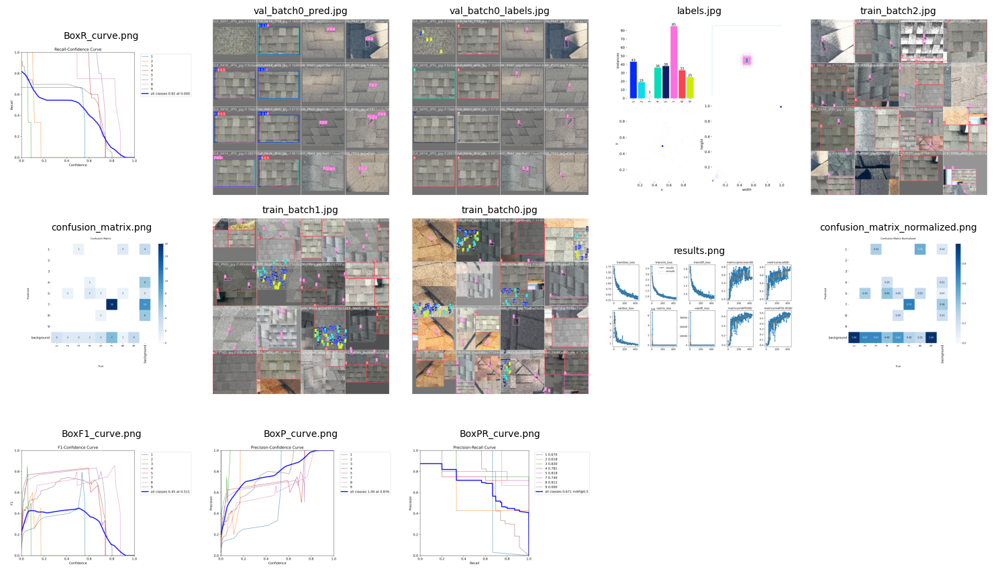

🎉 Toutes les images ont été affichées avec succès !


In [15]:
import os        # Pour interagir avec le système de fichiers
import cv2       # Pour lire les images
import matplotlib.pyplot as plt  # Pour afficher les images

def display_images_from_folder(folder_path):
    """
    Fonction ultra-détaillée pour trouver et afficher toutes les images (.jpg, .jpeg, .png) 
    présentes dans un dossier spécifié.
    Chaque étape est accompagnée de print pour la pédagogie.
    """
    
    print("🚀 Début de la lecture des images...\n")
    print(f"📂 Dossier ciblé : {folder_path}")
    
    # ------------------------------
    # Étape 1 : Vérification que le dossier existe
    # ------------------------------
    if not os.path.exists(folder_path):
        print("❌ Erreur : le dossier spécifié n'existe pas !")
        return
    else:
        print("✅ Dossier trouvé avec succès.")
    
    # ------------------------------
    # Étape 2 : Définition des extensions d'images valides
    # ------------------------------
    valid_extensions = ('.jpg', '.jpeg', '.png')
    print(f"🖼️ Extensions d'images autorisées : {valid_extensions}")
    
    # ------------------------------
    # Étape 3 : Liste des fichiers images
    # ------------------------------
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(valid_extensions)]
    print(f"🔍 Nombre d'images trouvées : {len(image_files)}")
    
    if not image_files:
        print("⚠️ Aucun fichier image valide trouvé dans le dossier.")
        return
    else:
        print("✅ Fichiers images détectés :")
        for f in image_files:
            print(f"   - {f}")
    
    # ------------------------------
    # Étape 4 : Préparation de l'affichage
    # ------------------------------
    plt.figure(figsize=(15, 15))  # Taille de la figure globale
    print("\n📊 Préparation de l'affichage des images...")
    
    # ------------------------------
    # Étape 5 : Lecture et affichage des images
    # ------------------------------
    for i, image_file in enumerate(image_files):
        image_path = os.path.join(folder_path, image_file)
        print(f"🔹 Lecture de l'image {i+1}/{len(image_files)} : {image_file}")
        
        # Lecture de l'image avec OpenCV
        image = cv2.imread(image_path)
        if image is None:
            print(f"⚠️ Impossible de lire l'image : {image_file}, passage à la suivante.")
            continue
        
        # Conversion BGR -> RGB pour affichage correct avec matplotlib
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Création d'un subplot pour chaque image
        plt.subplot(5, 5, i+1)  # Ici on prévoit une grille 5x5
        plt.imshow(image_rgb)
        plt.title(image_file, fontsize=10)
        plt.axis('off')
    
    # ------------------------------
    # Étape 6 : Ajustement final et affichage
    # ------------------------------
    plt.tight_layout()
    print("\n✅ Affichage final des images...")
    plt.show()
    print("🎉 Toutes les images ont été affichées avec succès !")

# ------------------------------
# Exemple d'appel
# ------------------------------
display_images_from_folder("/kaggle/working/training_backup/taffic")


🚀 Début de l'exécution de YOLOv11...

📦 Chargement du modèle YOLOv11 depuis : /kaggle/working/training_backup/taffic/weights/best.pt
✅ Modèle chargé avec succès.

📂 Dossier de sortie créé : /kaggle/working/result_vis
🔍 27 images détectées dans le dossier '/kaggle/working/yolo_split/val/images'
ℹ️ Traitement de 20 images sélectionnées aléatoirement.

🔹 Traitement de l'image 1/20 : 94_PNG_jpg.rf.c06ea4b6315fa41e3718a833eba09fbe.jpg
   ✅ Image chargée avec succès.
   🛠️ Exécution de la prédiction YOLOv11...

image 1/1 /kaggle/working/yolo_split/val/images/94_PNG_jpg.rf.c06ea4b6315fa41e3718a833eba09fbe.jpg: 416x480 (no detections), 188.2ms
Speed: 4.5ms preprocess, 188.2ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 480)
   ✅ Prédiction terminée.
   🎨 Image résultat générée avec les prédictions.
   💾 Image résultat sauvegardée dans : /kaggle/working/result_vis/94_PNG_jpg.rf.c06ea4b6315fa41e3718a833eba09fbe.jpg

🔹 Traitement de l'image 2/20 : DJI_0416_JPG_jpg.rf.19ab519c06544

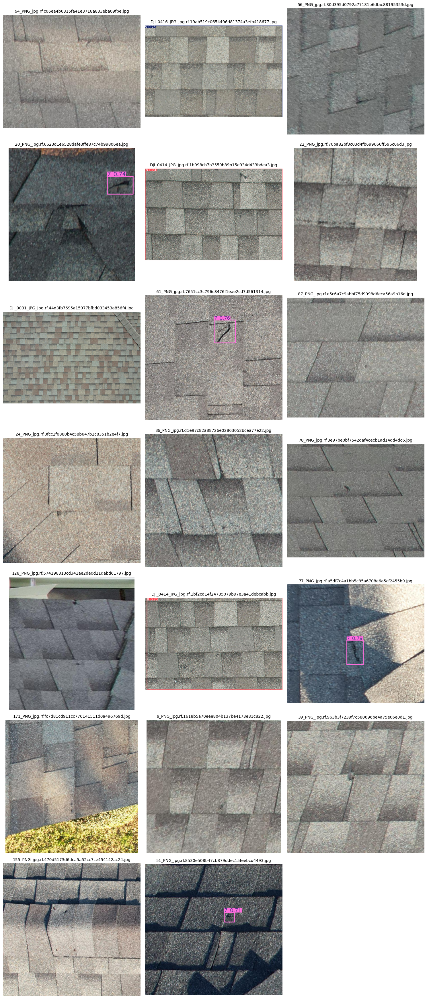

🎉 Toutes les images résultat ont été affichées avec succès !


In [16]:
import os
import random
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO  # Assurez-vous d'avoir YOLOv11 installé et importé

def run_yolov11(image_dir, model_path, total_image=20, output_folder="/kaggle/working/result_vis"):
    """
    Fonction ultra-détaillée pour exécuter YOLOv11 sur un dossier d'images.
    Chaque étape est expliquée avec des print pour la pédagogie.
    
    Paramètres :
    - image_dir : dossier contenant les images à traiter
    - model_path : chemin vers le modèle YOLOv11
    - total_image : nombre d'images aléatoires à traiter (-1 = toutes)
    - output_folder : dossier où enregistrer les images résultats
    """
    
    print("🚀 Début de l'exécution de YOLOv11...\n")
    
    # ------------------------------
    # Étape 1 : Chargement du modèle YOLOv11
    # ------------------------------
    print(f"📦 Chargement du modèle YOLOv11 depuis : {model_path}")
    model = YOLO(model_path)
    print("✅ Modèle chargé avec succès.\n")
    
    # ------------------------------
    # Étape 2 : Vérification / création du dossier de sortie
    # ------------------------------
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
        print(f"📂 Dossier de sortie créé : {output_folder}")
    else:
        print(f"📂 Dossier de sortie existant : {output_folder}")
    
    # ------------------------------
    # Étape 3 : Listing des fichiers images
    # ------------------------------
    image_files = [f for f in os.listdir(image_dir) if f.lower().endswith(('.jpeg', '.jpg', '.png'))]
    print(f"🔍 {len(image_files)} images détectées dans le dossier '{image_dir}'")
    
    if not image_files:
        print("⚠️ Aucun fichier image valide trouvé. Fin du programme.")
        return
    
    # ------------------------------
    # Étape 4 : Sélection aléatoire des images
    # ------------------------------
    if total_image == -1:
        selected_files = image_files
        print("ℹ️ Traitement de toutes les images disponibles.")
    else:
        selected_files = random.sample(image_files, min(total_image, len(image_files)))
        print(f"ℹ️ Traitement de {len(selected_files)} images sélectionnées aléatoirement.")
    
    # Liste pour stocker les images résultat
    result_images = []
    
    # ------------------------------
    # Étape 5 : Boucle de traitement des images
    # ------------------------------
    for idx, image_file in enumerate(selected_files):
        image_path = os.path.join(image_dir, image_file)
        print(f"\n🔹 Traitement de l'image {idx+1}/{len(selected_files)} : {image_file}")
        
        # Lecture de l'image
        image = cv2.imread(image_path)
        if image is None:
            print(f"⚠️ Impossible de lire l'image {image_file}, passage à la suivante.")
            continue
        print("   ✅ Image chargée avec succès.")
        
        # Prédiction YOLOv11
        print("   🛠️ Exécution de la prédiction YOLOv11...")
        results = model.predict(image_path, conf=0.7, iou=0.7)
        print("   ✅ Prédiction terminée.")
        
        # Génération de l'image résultat avec les masques / boxes
        result_image = results[0].plot()
        print("   🎨 Image résultat générée avec les prédictions.")
        
        # Sauvegarde de l'image résultat
        output_image_path = os.path.join(output_folder, image_file)
        cv2.imwrite(output_image_path, result_image)
        print(f"   💾 Image résultat sauvegardée dans : {output_image_path}")
        
        # Conversion en RGB pour l'affichage avec matplotlib
        result_images.append(cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
    
    # ------------------------------
    # Étape 6 : Affichage des images résultat
    # ------------------------------
    num_images = len(result_images)
    if num_images == 0:
        print("⚠️ Aucune image résultat à afficher.")
        return
    
    print("\n📊 Affichage des images résultat...")
    cols = 3
    rows = (num_images + cols - 1) // cols
    
    plt.figure(figsize=(15, 5 * rows))
    for i in range(num_images):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(result_images[i])
        plt.axis('off')
        plt.title(selected_files[i], fontsize=10)
    
    plt.tight_layout()
    plt.show()
    print("🎉 Toutes les images résultat ont été affichées avec succès !")

# ------------------------------
# Exemple d'appel
# ------------------------------
run_yolov11(
    image_dir="/kaggle/working/yolo_split/val/images",
    model_path="/kaggle/working/training_backup/taffic/weights/best.pt",
    total_image=20,
    output_folder="/kaggle/working/result_vis"
)


In [17]:
# Export the model
model.export(format="onnx")

Ultralytics 8.3.203 🚀 Python-3.11.13 torch-2.6.0+cu124 CPU (Intel Xeon CPU @ 2.20GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/
YOLO11n summary (fused): 100 layers, 2,583,712 parameters, 0 gradients, 6.3 GFLOPs

PyTorch: starting from '/kaggle/working/training_backup/taffic/weights/best.pt' with input shape (1, 3, 480, 480) BCHW and output shape(s) (1, 12, 4725) (5.2 MB)
requirements: Ultralytics requirements ['onnxslim>=0.1.67', 'onnxruntime'] not found, attempting AutoUpdate...

requirements: AutoUpdate success ✅ 2.7s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.18.0 opset 19...
ONNX: slimming with onnxslim 0.1.69...
ONNX: export success ✅ 6.1s, saved as '/kaggle/working/training_backup/taffic/weights/best.onnx' (10.0 MB)

Export complete (6.7s)
Results saved to /kaggle/working/training_backup/taffic/weights
Pr

'/kaggle/working/training_backup/taffic/weights/best.onnx'

In [18]:
import shutil

# Chemin source de ton modèle ONNX
source_path = "/kaggle/working/training_backup/taffic/weights/best.onnx"

# Chemin de destination dans /kaggle/working
destination_path = "/kaggle/working/best.onnx"

# Copie du fichier
shutil.copy(source_path, destination_path)
print("✅ Fichier déplacé vers :", destination_path)


✅ Fichier déplacé vers : /kaggle/working/best.onnx


In [19]:
import secrets
import base64

# Générer une clé de 64 octets
secret_key = secrets.token_hex(32)  # 32 bytes = 64 caractères hex
print(f"Clé hexadécimale: {secret_key}")

# Ou en base64
secret_key_base64 = base64.urlsafe_b64encode(secrets.token_bytes(64)).decode()
print(f"Clé base64: {secret_key_base64}")

Clé hexadécimale: e81f969ecb3fb11d90cc8928791ec8d563559b89a0501b0b90a3b0c05d257509
Clé base64: eVrdWWriNloI1diAr3cAL52FWXOn2wVs7e-P4lH0A96LaiyUyy6Yh-MD1pb6o9Y5Uga1vr9yG15AWJkGM9tISw==
